In [ ]:
!pip install -r /kaggle/input/bd-requirements/bd_requirements.txt

In [2]:
import os
import glob
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import random
import math
import cv2
from tqdm.notebook import tqdm
from skimage import io, transform
import rasterio as rio
from rasterio import features
from pathlib import Path
import pathlib
import geopandas as gpd
from PIL import Image
import tifffile as tiff
import xarray as xr
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from collections import defaultdict
import torch
import torch.optim as optim
from torch import nn
import torch.nn.functional as F
from torch.optim import lr_scheduler
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, Sampler, BatchSampler
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp

In [3]:
def link_image_and_mask_files(image_dir, image_pattern):
    image_files = sorted(glob.glob(os.path.join(image_dir, image_pattern)))
    
    # Link the files
    linked_files = [img_file for img_file in image_files]
    
    return linked_files

image_dir = '/kaggle/input/spacenet-2-paris-buildings/AOI_3_Paris_Test_public/AOI_3_Paris_Test_public/RGB-PanSharpen'
image_pattern = 'RGB-PanSharpen_AOI_3_Paris_img*.tif'

file_list = link_image_and_mask_files(image_dir, image_pattern)
print(len(file_list))
print(type(file_list[0]))
file_list[0]

381
<class 'str'>


'/kaggle/input/spacenet-2-paris-buildings/AOI_3_Paris_Test_public/AOI_3_Paris_Test_public/RGB-PanSharpen/RGB-PanSharpen_AOI_3_Paris_img1.tif'

Image shape: (650, 650, 3)
Image data type: uint16
Min value: 19.0, Max value: 1716.0


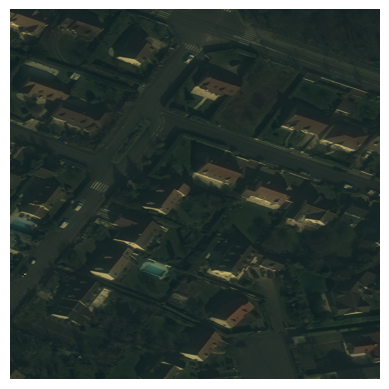

In [4]:
# Read the image using tifffile
img = tiff.imread(file_list[10])

# Check if the image is read correctly
print(f"Image shape: {img.shape}")
print(f"Image data type: {img.dtype}")

# Convert to float32
img_rgb = img.astype(np.float32)

# Print min and max values to check the range
print(f"Min value: {img_rgb.min()}, Max value: {img_rgb.max()}")

# Normalize the image for matplotlib display
img_rgb_normalized = img_rgb / img_rgb.max()

# Plot the image
plt.imshow(img_rgb_normalized)
plt.axis('off')  # Hide axis
plt.show()

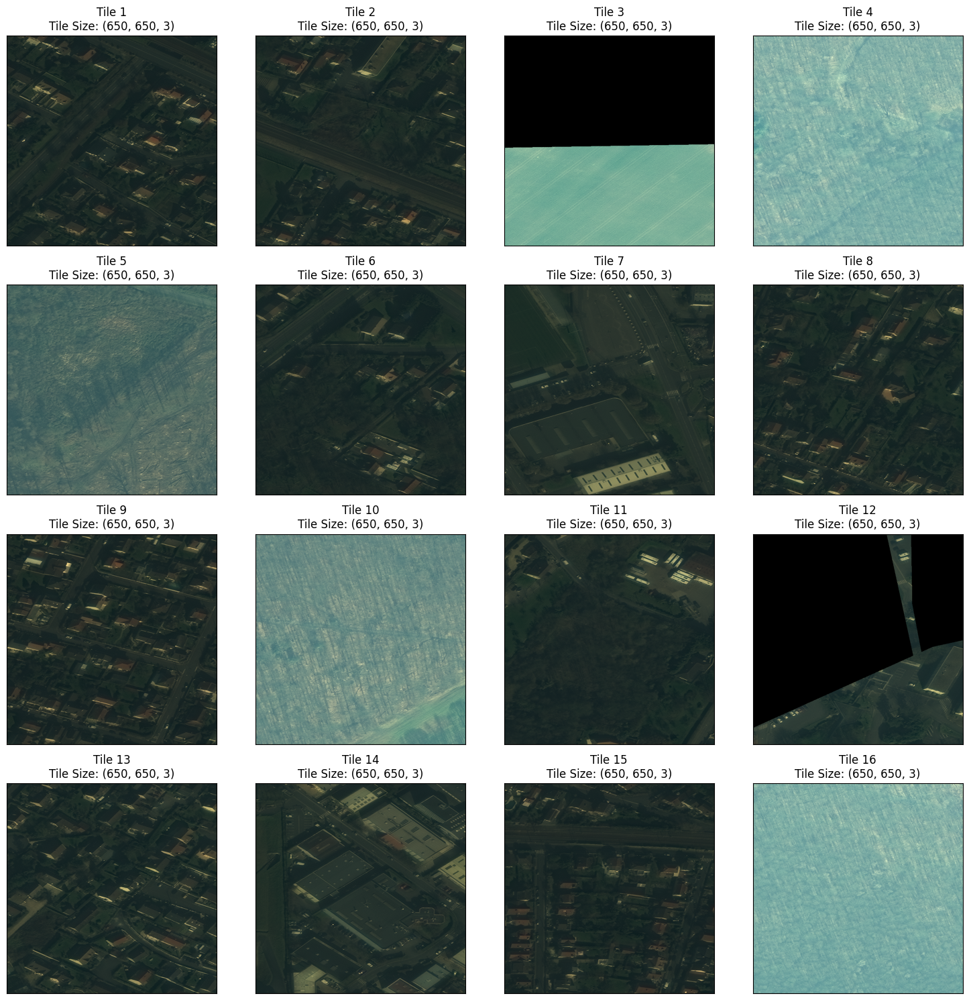

In [5]:
def visualize_images(img_tiles):
    num_tiles = len(img_tiles)
    rows = int(math.sqrt(num_tiles))
    cols = int(math.sqrt(num_tiles))

    plt.figure(figsize=(15, 15))
    # Display individual tiles with masks
    for i, tile in enumerate(img_tiles):
        plt.subplot(rows, cols, i + 1)
        img = tiff.imread(tile)
        img = img.astype(np.float32)
        img = img / img.max()
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
        plt.title(f'Tile {i + 1}\nTile Size: {img.shape}')
    plt.tight_layout()
    plt.show()

img_list = random.sample(file_list, 16)
visualize_images(img_list)

In [6]:
class_size = 1
model = smp.Unet(
    encoder_name="resnet101",      
    encoder_weights="imagenet",     
    in_channels=3,                  
    classes=class_size,                  
)

model.load_state_dict(torch.load('/kaggle/input/spacenet2_building_detection/pytorch/version1/1/spacenet_2_paris_best.pth'))
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)
print(device)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:00<00:00, 242MB/s]  


cuda


In [8]:
def pad_images_to_divisible_by_32(image):
    # Calculate the padding sizes
    height, width = image.shape[-2], image.shape[-1]
    pad_height = (32 - height % 32) if height % 32 != 0 else 0
    pad_width = (32 - width % 32) if width % 32 != 0 else 0
    # Pad the image and mask
    image = F.pad(image, (0, pad_width, 0, pad_height), mode='constant', value=0)
    return image

In [10]:
# image = pad_images_to_divisible_by_32(file_list[10])
# print(image.shape)

In [11]:
img = tiff.imread(file_list[10])
img = img.astype(np.float32)
# Transpose image
img = img.transpose(2, 1, 0)
img = torch.tensor(img, dtype=torch.float32)
img_min, img_max = img.min(), img.max()
img_tiles_normalized = (img - img_min) / (img_max - img_min)

# Pad image and mask to be divisible by 32
image = pad_images_to_divisible_by_32(img_tiles_normalized)
print(image.shape)
image = image.to(device)

model.eval()
with torch.no_grad():
    output = model(image.unsqueeze(0))
output = torch.sigmoid(output).cpu().numpy()
output = output.squeeze() 
print(f"Image shape: {output.shape}")
print(f"Image data type: {output.dtype}")
print(f"Image type: {type(output)}")
# Convert the output to a binary mask
threshold = 0.5
binary_mask = output > threshold

torch.Size([3, 672, 672])
Image shape: (672, 672)
Image data type: float32
Image type: <class 'numpy.ndarray'>


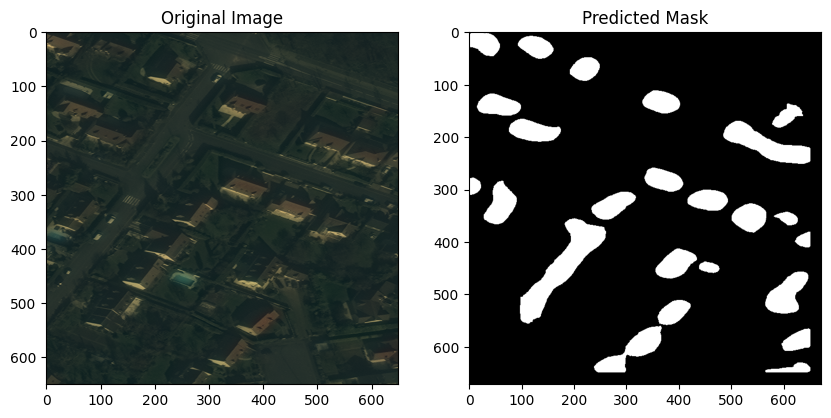

In [12]:
# Visualize the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
img = tiff.imread(file_list[10])
img_rgb = img.astype(np.float32)
img_rgb_normalized = img_rgb / img_rgb.max()
plt.imshow(img_rgb_normalized)

plt.subplot(1, 2, 2)
plt.title('Predicted Mask')
plt.imshow(binary_mask, cmap='gray')

plt.show()

In [13]:
def pred_img(img_path, model):
    # Read and clean up img
    img = tiff.imread(img_path)
    img = img.astype(np.float32)
    img = img.transpose(2, 1, 0)
    img = torch.tensor(img, dtype=torch.float32)
    img_min, img_max = img.min(), img.max()
    img_tiles_normalized = (img - img_min) / (img_max - img_min)
    # Pad image and mask to be divisible by 32
    img_pad = pad_images_to_divisible_by_32(img_tiles_normalized)
    # Model prediction
    image = img_pad.to(device)
    model.eval()
    with torch.no_grad():
        output = model(image.unsqueeze(0))
    output = torch.sigmoid(output).cpu().numpy()
    output = output.squeeze() 
    # Convert the output to a binary mask
    threshold = 0.5
    binary_mask = output > threshold
    return img_pad, binary_mask

In [14]:
img, mask = pred_img(file_list[10], model)

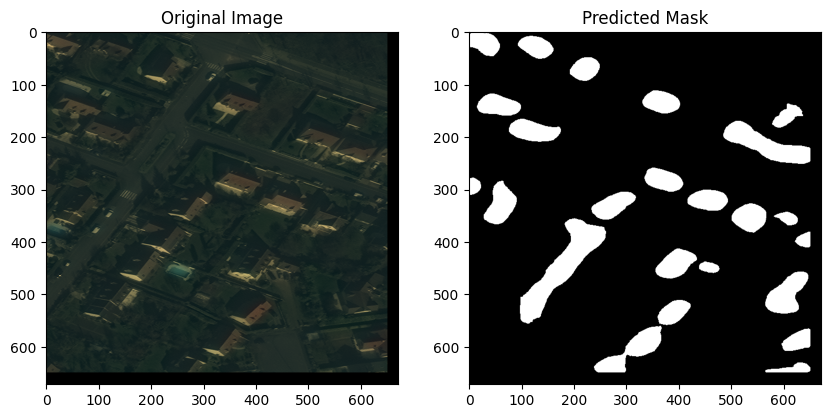

In [15]:
# Visualize the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
img = img.permute(2,1,0)
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.title('Predicted Mask')
plt.imshow(mask, cmap='gray')

plt.show()

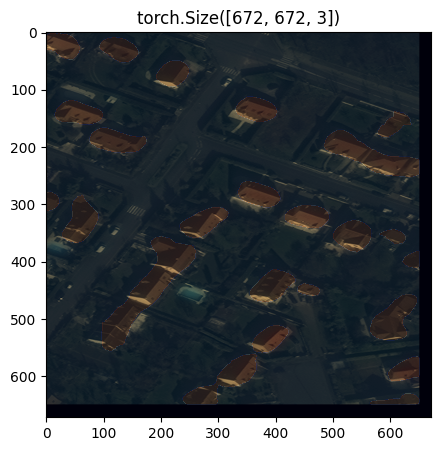

In [17]:
# Visualize the results
plt.figure(figsize=(10, 5))
# tile = tile.permute(2,1,0)
plt.imshow(img)
plt.imshow(mask, cmap='seismic', alpha=0.15)
plt.title(f'{img.shape}')
plt.show()

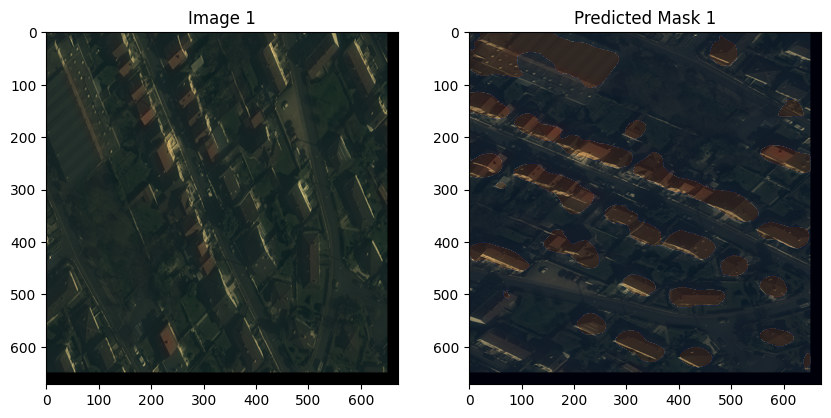

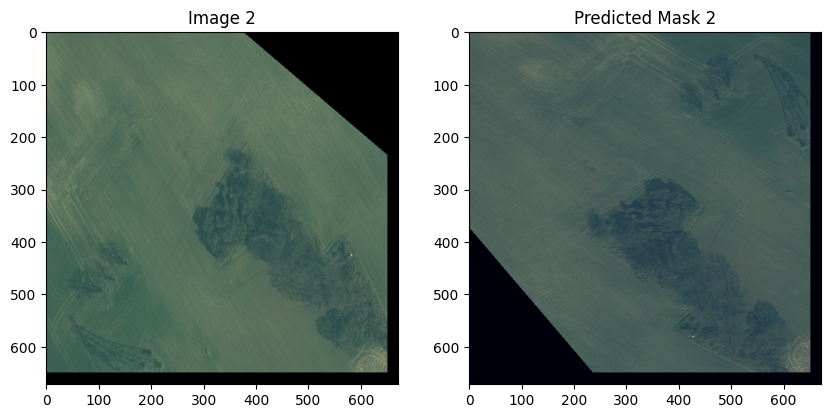

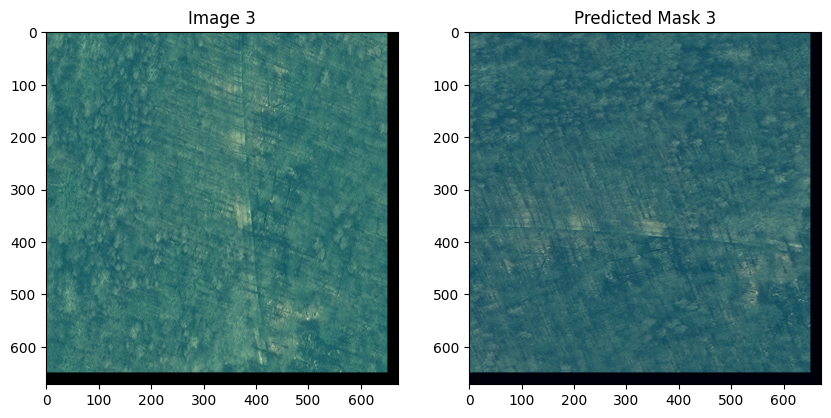

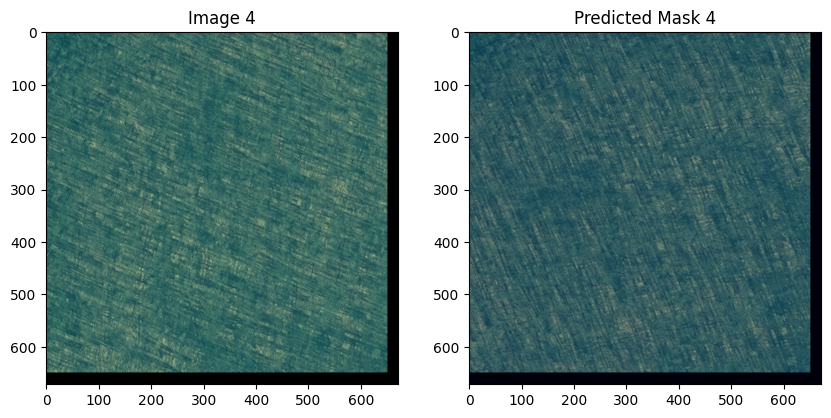

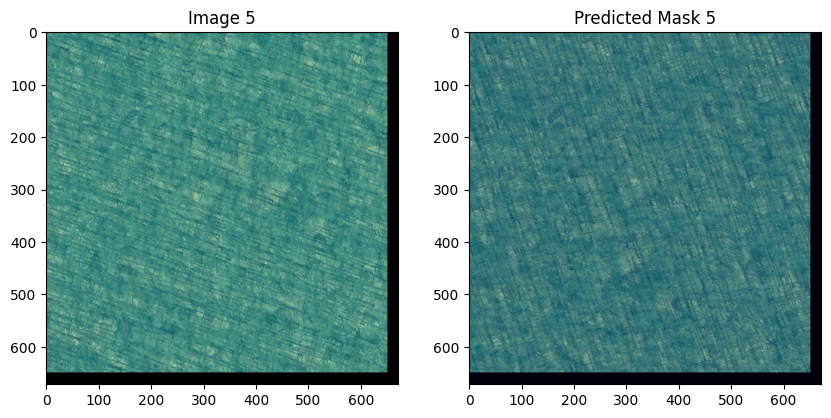

...

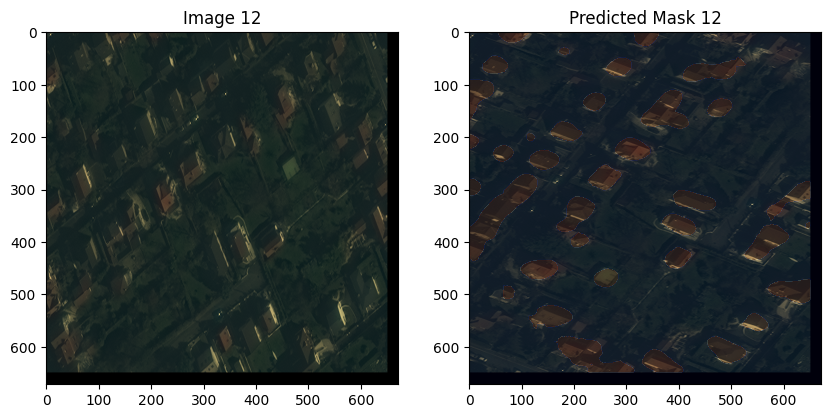

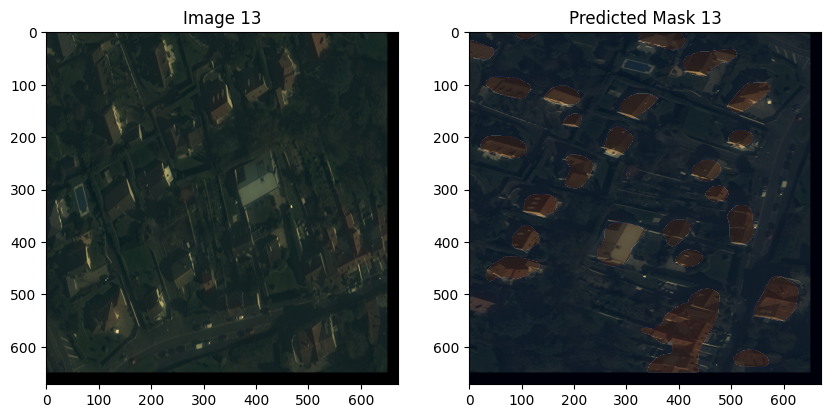

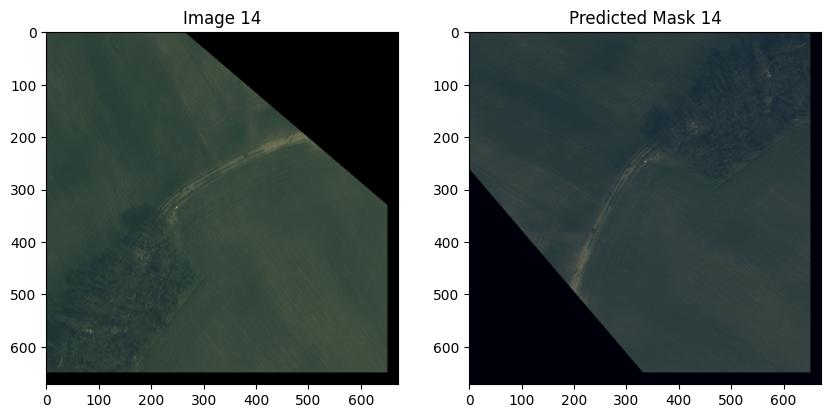

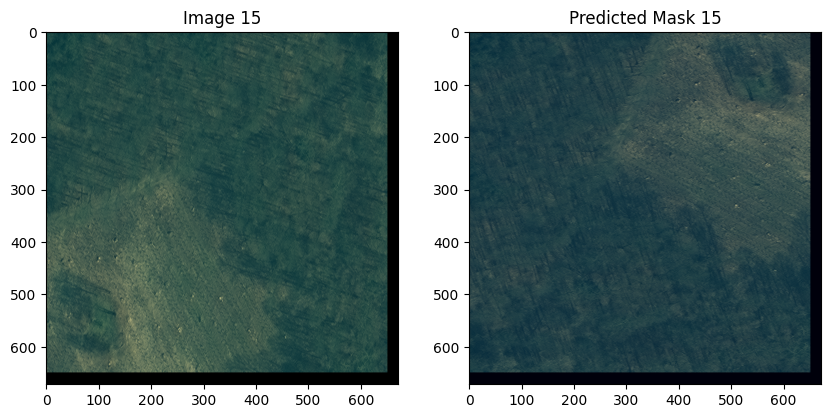

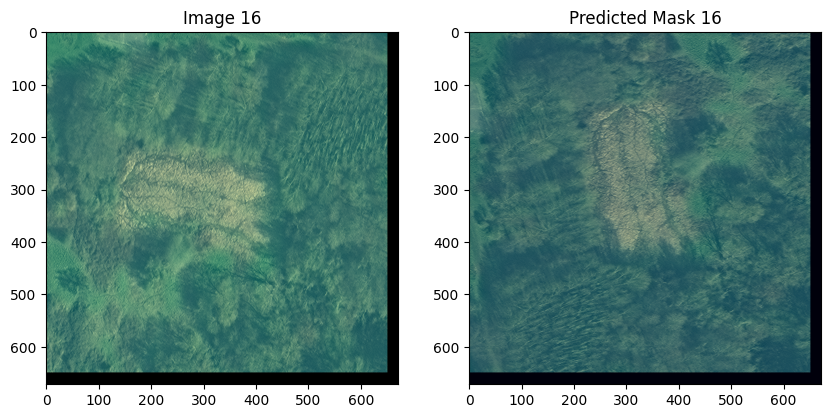

In [26]:
img_list = random.sample(file_list, 16)
for i, img_path in enumerate(img_list):
    img, mask = pred_img(img_path, model)
    
    # Visualize the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img.cpu().numpy().transpose(1, 2, 0))  # Convert the tensor to numpy and transpose for visualization
    plt.title(f'Image {i + 1}')
    
    plt.subplot(1, 2, 2)
    tile = img.permute(2,1,0)
    plt.imshow(tile)
    plt.imshow(mask, cmap='seismic', alpha=0.15)
    plt.title(f'Predicted Mask {i + 1}')
    
    plt.show()

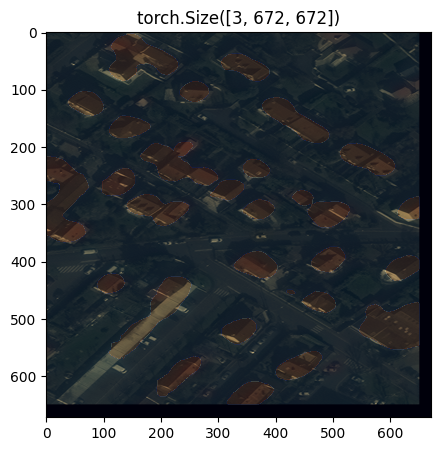

In [25]:
img, mask = pred_img(img_list[12], model)
# Visualize the results
plt.figure(figsize=(10, 5))
tile = img.permute(2,1,0)
plt.imshow(tile)
plt.imshow(mask, cmap='seismic', alpha=0.15)
plt.title(f'{img.shape}')
plt.show()